# Analisis de genomas del COVID19

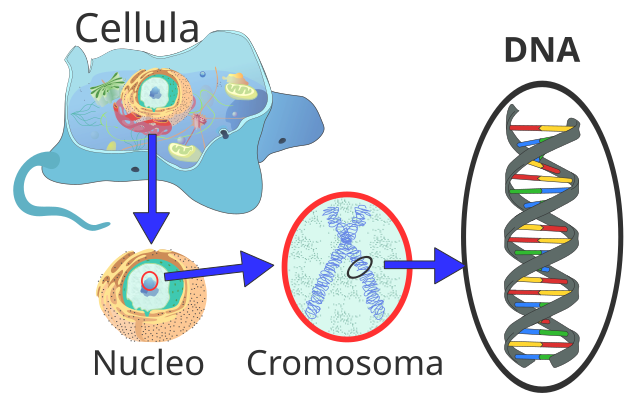

### Librerias

In [ ]:
#@title Descargando librerias externas
!pip install biopython
!pip install geopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 19.0 MB/s eta 0:00:00


In [ ]:
#@title Librerias usadas
from os import listdir
import networkx as nx
import pandas as pd
import re
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import numpy as np
from Bio.Seq import Seq
from geopy.geocoders import Nominatim

## Data Understanding

### Obtencion inicial de los datos

In [ ]:
#@title Descomprimiendo los archivos txt
!mkdir genoma
!mv archive.zip genoma
!unzip genoma/archive.zip -d genoma

Archive:  genoma/archive.zip
  inflating: genoma/LC528232.txt     
  inflating: genoma/LC528233.txt     
  inflating: genoma/LC529905.txt     
  inflating: genoma/LC534418.txt     
  inflating: genoma/LC534419.txt     
  inflating: genoma/LR757995.txt     
  inflating: genoma/LR757996.txt     
  inflating: genoma/LR757998.txt     
  inflating: genoma/MN908947.txt     
  inflating: genoma/MN938384.txt     
  inflating: genoma/MN975262.txt     
  inflating: genoma/MN985325.txt     
  inflating: genoma/MN988668.txt     
  inflating: genoma/MN988669.txt     
  inflating: genoma/MN988713.txt     
  inflating: genoma/MN994467.txt     
  inflating: genoma/MN994468.txt     
  inflating: genoma/MN996527.txt     
  inflating: genoma/MN996529.txt     
  inflating: genoma/MN996530.txt     
  inflating: genoma/MN996531.txt     
  inflating: genoma/MN997409.txt     
  inflating: genoma/MZ359830.txt     
  inflating: genoma/MZ359831.txt     
  inflating: genoma/MZ359832.txt     
  inflating: genoma/M

In [ ]:
#@title Obteniendo los archivos ordenados de forma alfabetica
files = sorted([f for f in listdir("/content/genoma") if f[-3:] == "txt"])
print(files)

['LC528232.txt', 'LC528233.txt', 'LC529905.txt', 'LC534418.txt', 'LC534419.txt', 'LR757995.txt', 'LR757996.txt', 'LR757998.txt', 'MN908947.txt', 'MN938384.txt', 'MN975262.txt', 'MN985325.txt', 'MN988668.txt', 'MN988669.txt', 'MN988713.txt', 'MN994467.txt', 'MN994468.txt', 'MN996527.txt', 'MN996529.txt', 'MN996530.txt', 'MN996531.txt', 'MN997409.txt', 'MZ359830.txt', 'MZ359831.txt', 'MZ359832.txt', 'MZ359833.txt', 'MZ359834.txt', 'MZ359835.txt', 'MZ359839.txt', 'MZ373337.txt', 'MZ373338.txt', 'MZ373339.txt', 'MZ373340.txt', 'MZ373341.txt', 'MZ373342.txt', 'MZ373343.txt', 'MZ373344.txt', 'MZ373345.txt', 'MZ373346.txt', 'MZ373347.txt', 'MZ373348.txt', 'MZ373349.txt', 'MZ373350.txt']


In [ ]:
#@title Metiendo todo dentro del dataframe

df = pd.DataFrame(columns=files)
# Funcion anonima que obtiene el texto del archivo
texto = lambda x: re.sub(r"[0-9|W|N]+", "", open("/content/genoma/"+x, 'r', encoding="utf-8-sig").read().replace("\n", "").replace(" ", "")).upper()
# Obteniendo el valor de la cadena mas larga
maximo = max([len(texto(i)) for i in files])
# Normalizando las columnas con none
for i in files:
  f = texto(i)
  if all(letra in ['A', 'T', 'G', 'C'] for letra in f):
    df[i] = list(f)+[None]*(maximo-len(f))

filtered_columns = df.columns[df.count() > 0]
df = df[filtered_columns]
df.head(10)

,LC528232.txt,LC528233.txt,LC529905.txt,LC534418.txt,LC534419.txt,LR757995.txt,LR757996.txt,LR757998.txt,MN908947.txt,MN938384.txt,...,MZ373341.txt,MZ373342.txt,MZ373343.txt,MZ373344.txt,MZ373345.txt,MZ373346.txt,MZ373347.txt,MZ373348.txt,MZ373349.txt,MZ373350.txt
0,T,C,A,A,C,T,C,A,A,C,...,C,A,T,G,G,A,C,A,G,C
1,G,C,T,A,A,T,A,A,T,A,...,A,C,A,G,T,A,C,A,G,G
2,C,C,T,G,C,T,G,C,T,A,...,A,C,C,T,A,G,A,G,T,A
3,T,C,A,G,C,C,G,A,A,C,...,C,A,C,T,A,G,A,G,A,T
4,T,A,A,T,T,C,T,A,A,C,...,T,A,T,T,C,T,C,T,A,C
5,A,A,A,T,T,C,A,A,A,A,...,T,C,T,A,A,T,C,T,C,T
6,T,A,G,T,C,A,A,C,G,A,...,T,C,C,T,A,T,A,T,A,C
7,G,A,G,A,C,G,C,C,G,C,...,C,A,C,A,A,A,A,A,A,T
8,A,T,T,T,C,G,A,A,T,T,...,G,A,C,C,C,T,C,T,A,T
9,A,G,T,A,A,T,A,A,T,T,...,A,C,A,C,C,A,T,A,C,G


<H2>Podemos observar que los archivos nos muestran cadenas que representan el genoma del virus. Estas estan compuestas de las bases nitrogenadas de diferentes epocas

### Graficas descriptivas de los genomas

In [ ]:
#@title Cantidad de caracteres por archivo quedandonos con los que si tengan datos

filtered_counts = df.count().sort_values(ascending=False)

fig = px.bar(x=df.columns, y=filtered_counts, color=df.columns)

fig.update_traces(
    hovertemplate='<b>Caracteres:</b> %{y}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Cantidad de caracteres por archivo',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    legend_font_size=16,
    template="plotly_dark",
    xaxis_title='Archivos',
    yaxis_title='Numero de Caracteres',
    legend_title="Archivos"
)

fig.show()

In [ ]:
#@title Contando las bases nitrogenadas por archivo
df_count = df.agg({i:"value_counts" for i in df.columns})
df_count.head()

,LC528232.txt,LC528233.txt,LC529905.txt,LC534418.txt,LC534419.txt,LR757995.txt,LR757996.txt,LR757998.txt,MN908947.txt,MN938384.txt,...,MZ373341.txt,MZ373342.txt,MZ373343.txt,MZ373344.txt,MZ373345.txt,MZ373346.txt,MZ373347.txt,MZ373348.txt,MZ373349.txt,MZ373350.txt
T,9605,9601,9596,9595,9590,9589,9586,9584,9594,9586,...,9585,9600,9587,9602,9591,9602,9515,9603,9598,8496
A,8939,8933,8954,8931,8932,8932,8933,8937,8954,8909,...,8896,8906,8909,8913,8926,8931,8847,8931,8924,7906
G,5865,5869,5864,5861,5860,5861,5861,5859,5863,5859,...,5846,5854,5854,5859,5857,5864,5811,5857,5855,5243
C,5493,5499,5489,5491,5492,5490,5488,5486,5492,5484,...,5468,5473,5476,5481,5482,5482,5429,5485,5479,4866


In [ ]:
#@title Grafica general de los promedios por bases nitrogenadas englobando iniciales

fig = go.Figure()

for i, abreviatura in enumerate(set([col[:2] for col in df_count.columns])):
    columns = [col for col in df_count.columns if col[:2] == abreviatura]
    mean_values = df_count[columns].mean(axis=1)
    fig.add_trace(go.Barpolar(
        r=[round(i) for i in mean_values],
        theta=df_count.index,
        name=abreviatura,
        marker_color=px.colors.sequential.Plasma_r[i],
        hovertemplate="Archivo:"+ abreviatura +"<br>Base Nitrogenada: %{theta}<br>Cantidad: %{r}<extra></extra>"
    ))


fig.update_traces(
    text=df_count.index
)

fig.update_layout(
    title={
      'text': 'Promedio de bases nitrogenadas por iniciales',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    legend_font_size=16,
    polar_angularaxis_rotation=90,
    template="plotly_dark",
    legend_title="Archivo",
    width=600,
    height=400,
    polar=dict(
        angularaxis=dict(
            showticklabels=True,
            tickvals=df_count.index
        ),
        radialaxis=dict(
            showticklabels=False
        )
    )
)

fig.show()


In [ ]:
#@title Funcion que genera un grafo circular con las similitudes de cada genoma
def grafo_plotly_circular(df, radio_factor=1.5, ancho=800, alto=800):
    # Asegurarse de que la columna 'Similitud' esté presente
    if 'Similitud' not in df.columns:
        raise ValueError("El DataFrame debe contener una columna 'Similitud'.")

    # Filtrar las 5 conexiones con mayor similitud por cada nodo
    conexiones_filtradas = []

    for nodo in set(df['Antecedente']).union(set(df['Consecuente'])):
        # Filtrar las filas donde el nodo es antecedente o consecuente
        conexiones_nodo = df[df['Antecedente'] == nodo]

        # Ordenar por similitud de mayor a menor
        conexiones_nodo = conexiones_nodo.sort_values(by='Similitud', ascending=False)

        # Tomar solo las 5 primeras conexiones
        conexiones_filtradas.append(conexiones_nodo.head(5))

    # Unir las conexiones filtradas
    df_filtrado = pd.concat(conexiones_filtradas).reset_index(drop=True)

    # Obtener los nodos únicos (de las columnas "Antecedente" y "Consecuente")
    nodos = list(set(df_filtrado['Antecedente']).union(set(df_filtrado['Consecuente'])))
    num_nodos = len(nodos)

    # Calcular posiciones circulares (en radianes) con un radio aumentado por el factor
    angulos = np.linspace(0, 2 * np.pi, num_nodos, endpoint=False)  # Distribución equidistante
    pos = {nodo: (radio_factor * np.cos(angulo), radio_factor * np.sin(angulo)) for nodo, angulo in zip(nodos, angulos)}

    # Usar una paleta de colores para asignar colores a los nodos
    color_palette = px.colors.qualitative.Set1  # Cambia la paleta si quieres más colores
    node_colors = {nodo: color_palette[i % len(color_palette)] for i, nodo in enumerate(nodos)}

    # Preparar los datos para los nodos
    node_x = []
    node_y = []
    node_hovertext = []  # Aquí almacenaremos las etiquetas de hover con las conexiones

    for node in nodos:
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

        # Filtrar las conexiones para este nodo (solo las 5 más relevantes)
        conexiones_nodo = df_filtrado[(df_filtrado['Antecedente'] == node) | (df_filtrado['Consecuente'] == node)]

        # Construir la etiqueta con las conexiones y su similitud
        etiquetas_hover = [f"Genoma: {node}"]  # Incluir el nombre del nodo como parte del hover
        for _, row in conexiones_nodo.iterrows():
            if row['Antecedente'] == node:
                etiqueta = f"{row['Consecuente']} ({row['Similitud']}%)"
                etiquetas_hover.append(etiqueta)

        # Unir todas las etiquetas por salto de línea
        node_hovertext.append("<br>".join(etiquetas_hover))

    # Preparar los datos para las aristas (líneas entre nodos)
    edge_x = []
    edge_y = []
    edge_colors = []  # Lista para almacenar los colores de cada conexión

    for i, (_, row) in enumerate(df_filtrado.iterrows()):
        antecedente, consecuente = row['Antecedente'], row['Consecuente']
        x0, y0 = pos[antecedente]
        x1, y1 = pos[consecuente]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_y.append(y0)
        edge_y.append(y1)

        # Asignar el mismo color que el nodo para las aristas
        color_nodo = node_colors[antecedente]  # Asignar el color del nodo al que pertenece la arista
        edge_colors.append(color_nodo)

    # Crear el gráfico
    fig = go.Figure()

    # Añadir las aristas (líneas)
    for i in range(0, len(edge_x), 2):
        fig.add_trace(go.Scatter(
            x=edge_x[i:i+2],
            y=edge_y[i:i+2],
            mode='lines',
            line=dict(color=edge_colors[i//2], width=2)  # Usar el mismo color para cada arista
        ))

    # Añadir los nodos con solo las etiquetas de hover (sin posiciones en la etiqueta)
    fig.add_trace(go.Scatter(
        x=node_x,
        y=node_y,
        mode='markers+text',  # Solo los marcadores sin texto fijo en el nodo
        marker=dict(color=[node_colors[node] for node in nodos], size=15),  # Colores iguales para los nodos y sus conexiones
        text=[f'{node}' for node in nodos],  # Mostrar el nombre de cada nodo
        textposition="bottom center",  # Colocar el texto debajo del nodo
        hovertext=node_hovertext,  # Solo las etiquetas de hover con las conexiones
        hoverinfo='text'  # Asegurarse de que solo se muestre el hovertext
    ))

    # Ajustar el diseño y eliminar los ejes
    fig.update_layout(
        title={
          'text': "Grafo con Disposición Circular y Conexiones Filtradas por Similitud",
          'x': 0.5,  # Centra el título horizontalmente
          'xanchor': 'center',  # Ancla el título al centro
          'yanchor': 'top',  # Ancla el título en la parte superior
          'font': dict(color='white')  # Color blanco para el título
        },
        showlegend=False,
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        plot_bgcolor='black',  # Fondo del área de graficado
        paper_bgcolor='black',  # Fondo de toda la figura, incluida el área fuera del gráfico
        width=ancho,  # Tamaño ajustable
        height=alto,  # Tamaño ajustable
        autosize=False,
        font=dict(color='white')  # Color blanco para todo el texto
    )

    # Mostrar el gráfico
    fig.show()

In [ ]:
#@title Creando un grafo para identificar los genomas mas parecidos

df_reglas = pd.DataFrame(columns=['Antecedente', 'Consecuente', 'Similitud'])

for f in range(len(df.columns)):
  for k in range(len(df.columns)):
    if f == k:
      pass
    else:
      calculo = 100*(df[df.columns[f]][df[df.columns[f]] == df[df.columns[k]]].dropna().count() / len(df[df.columns[f]]))
      df_reglas.loc[len(df_reglas)] = [df.columns[f], df.columns[k], f"{calculo:.2f}"]

grafo_plotly_circular(df_reglas)

In [ ]:
#@title Funcion que obtiene los rangos de coincidencia de dos genomas

def get_reducido(col1, col2) -> list:
  similares = df[[col1, col2]].where(df[col1] == df[col2]).dropna()

  # Funcion que encuentra los rangos de las coincidencias consecutivas
  def recursive(index, cadena):
    try:
      if cadena[index]+1 == cadena[index+1]:
        return recursive(index+1, cadena)
      else:
        return index
    except:
      return index

  # Recorriendo los indices que coinciden para reducir las similitudes
  index = 0
  reducido = []
  while index < similares.iloc[:].index.size:
    new_index = recursive(index, similares.iloc[:].index)
    if index != new_index:
      reducido.append([similares.iloc[:].index[index], similares.iloc[:].index[new_index]])
      index = new_index
    else:
      reducido.append(similares.iloc[:].index[index])
    index += 1

  return reducido

In [ ]:
#@title Construyendo grafos comparativos entre dos genomas (primeras 26 relaciones)

transform = lambda df, reducido, col_name, ind_inf, ind_sup: ''.join(map(str, df[col_name][ind_inf:ind_sup])) if (ind_sup - ind_inf) > 0 else ''.join(map(str, df[col_name][ind_sup]))

for f in range(len(df.columns)-1):
    g = nx.DiGraph()
    reducido = get_reducido(df.columns[f], df.columns[f+1])
    if len(reducido) != 0:
      if type(reducido[0]) != list:
        if reducido[0] != 0:
          edges = [["0:O", "1:" + transform(df, reducido, df.columns[f], 0, reducido[0])],
          ["0:O", "1:" + transform(df, reducido, df.columns[f+1], 0, reducido[0])]]
          edges.append([edges[-1][1], "2:" + transform(df, reducido, df.columns[f], reducido[0]-1, reducido[0])])
          edges.append([edges[-3][1], "2:" + transform(df, reducido, df.columns[f], reducido[0]-1, reducido[0])])
        else:
          edges = [["0:O", "1:" + transform(df, reducido, df.columns[f], 0, reducido[0])]]
      else:
        if reducido[0][0] != 0:
          edges = [["0:O", "1:" + transform(df, reducido, df.columns[f], 0, reducido[0][0])],
          ["0:O", "1:" + transform(df, reducido, df.columns[f+1], 0, reducido[0][0])]]
          edges.append([edges[-1][1], "2:" + transform(df, reducido, df.columns[f], reducido[0][0], reducido[0][1])])
          edges.append([edges[-3][1], "2:" + transform(df, reducido, df.columns[f], reducido[0][0], reducido[0][1])])
        else:
          edges = [["0:O", "1:" + transform(df, reducido, df.columns[f], 0, reducido[0][1])]]

      for i in range(1, len(reducido)):
        ant = edges[-1][1]
        cont = 3+i if i == 1 else cont+2

        if type(reducido[i]) != list:
          if type(reducido[i-1]) != list:
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f], reducido[i-1], reducido[i])])
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f+1], reducido[i-1], reducido[i])])
          else:
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f], reducido[i-1][1], reducido[i])])
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f+1], reducido[i-1][1], reducido[i])])

          edges.append([edges[-1][1], f"{cont}:" + transform(df, reducido, df.columns[f], reducido[i]-1, reducido[i])])
          edges.append([edges[-3][1], f"{cont}:" + transform(df, reducido, df.columns[f], reducido[i]-1, reducido[i])])
        else:
          if type(reducido[i-1]) == list:
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f], reducido[i-1][1], reducido[i][0])])
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f+1], reducido[i-1][1], reducido[i][0])])
          else:
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f], reducido[i-1], reducido[i][0])])
            edges.append([ant, f"{cont-1}:" + transform(df, reducido, df.columns[f+1], reducido[i-1], reducido[i][0])])

          edges.append([edges[-1][1], f"{cont}:" + transform(df, reducido, df.columns[f], reducido[i][0], reducido[i][1])])
          edges.append([edges[-3][1], f"{cont}:" + transform(df, reducido, df.columns[f], reducido[i][0], reducido[i][1])])

      edges = edges[:24]

    # Modificar los nombres de los nodos si tienen más de 10 caracteres
    for e in range(len(edges)):
        if len(edges[e][0]) > 10:
            edges[e][0] = edges[e][0][:5] + "..."
        elif len(edges[e][1]) > 10:
            edges[e][1] = edges[e][1][:5] + "..."

    g.add_edges_from(edges)

    # Contar cuántos hijos tiene cada nodo
    child_count = {node: 0 for node in g.nodes}
    for edge in edges:
        child_count[edge[0]] += 1

    # Asignar posiciones a los nodos
    pos = {}

    for edge in edges:
        node1, node2 = edge

        if node1 not in pos:
            if child_count[node1] >= 1:
                pos[node1] = (0, int(node1.split(":")[0]))  # Nodo 1 en el centro

        if node2 not in pos:
            if child_count[node2] > 1 or child_count[node2] == 0:
                pos[node2] = (0, int(node2.split(":")[0]))  # Nodo 2 en el centro
            else:
                if len(pos) % 2 != 0:
                    pos[node2] = (0.5, int(node2.split(":")[0]))
                else:
                    pos[node2] = (-0.5, int(node2.split(":")[0]))

    # Obtener las posiciones de los nodos
    x_pos = [pos[node][0] for node in g.nodes]
    y_pos = [pos[node][1] for node in g.nodes]

    # Crear un gráfico de Plotly
    edge_x = []
    edge_y = []
    for edge in g.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_y.append(y0)
        edge_y.append(y1)

    # Crear la figura de Plotly
    fig = go.Figure()

    # Primero, agregar las aristas al gráfico
    for i in range(0, len(edge_x), 2):  # Recorremos las coordenadas de las aristas de dos en dos
        fig.add_trace(go.Scatter(
            x=edge_x[i:i+2],  # Usamos un slice de dos elementos (x0, x1)
            y=edge_y[i:i+2],  # Usamos un slice de dos elementos (y0, y1)
            line=dict(width=3, color='navy'),  # Personalizar el estilo de las líneas
            hoverinfo='none',  # Deshabilitar la información de hover
            mode='lines'  # Dibujar líneas
        ))

    # Crear un trace para los nodos
    node_trace = go.Scatter(
        x=x_pos, y=y_pos,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=False,
            colorscale='Viridis',
            size=12
        )
    )

    # Asignar los colores a los nodos como una lista de enteros
    node_trace.marker.color = list(range(len(g.nodes)))

    # Añadir las etiquetas de los nodos
    node_text = []
    for node in g.nodes:
        node_text.append(f'{node}')
    node_trace.text = node_text

    # Crear el layout para la figura
    layout = go.Layout(
        title=f"Similitudes entre {df.columns[f]} y {df.columns[f+1]}",
        titlefont=dict(size=12, color='white'),  # Centrar el título y poner el texto blanco
        showlegend=False,
        hovermode='closest',
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),  # Eliminar los ejes
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),  # Eliminar los ejes
        plot_bgcolor='black',
        paper_bgcolor='black',
        title_x=0.5,
        width=400,  # Reducir el ancho del gráfico
    )

    # Crear la figura final con nodos y aristas
    fig.add_trace(node_trace)

    fig.update_layout(layout)

    # Mostrar la figura
    fig.show()

In [ ]:
#@title Grafica 3D de la cadena de ADN del genoma LC528232

# Parámetros de la hélice
num_points = 200      # Número de puntos en cada cadena
turns = 5             # Número de vueltas de la hélice
radius = 0.2          # Radio de la hélice
height = 10           # Altura total de la hélice

# Función para generar una hélice
def helix(theta, radius, height, turns):
    z = np.linspace(0, height, len(theta))  # Altura a lo largo del eje z
    x = radius * np.cos(theta)  # Coordenada X de la hélice
    y = radius * np.sin(theta)  # Coordenada Y de la hélice
    return x, y, z

# Generamos un conjunto de puntos para la animación
theta = np.linspace(0, 2 * np.pi * turns, num_points)

# Cadenas de ADN: Una helicoidal positiva y otra negativa
x1, y1, z1 = helix(theta, radius, height, turns)  # Primera cadena (helicoidal)
x2, y2, z2 = helix(theta + np.pi, radius, height, turns)  # Segunda cadena (helicoidal, desplazada)

# Crear los pares de bases: líneas entre los puntos correspondientes de las dos cadenas
color_map = {
    'A': 'green', 'T': 'purple', 'C': 'coral', 'G': 'blueviolet'
}

# Crear pares de bases divididos por color
def get_pairs(x1, x2, y1, y2, z1, z2, bases):
    pairs = []
    for i in range(0, num_points, 2):
        base1, base2 = bases[i], bases[i + 1]
        pairs.append(
            go.Scatter3d(
                x=[x1[i], (x1[i] + x2[i]) / 2], y=[y1[i], (y1[i] + y2[i]) / 2], z=[z1[i], (z1[i] + z2[i]) / 2],
                mode='lines', line=dict(color=color_map[base1], width=4), showlegend=False,
                hovertext=f'Base: {base1}', hoverinfo="text"
            )
        )
        pairs.append(
            go.Scatter3d(
                x=[(x1[i] + x2[i]) / 2, x2[i]], y=[(y1[i] + y2[i]) / 2, y2[i]], z=[(z1[i] + z2[i]) / 2, z2[i]],
                mode='lines', line=dict(color=color_map[base2], width=4), showlegend=False,
                hovertext=f'Base: {base2}', hoverinfo="text"
            )
        )
    return pairs

# Cargar las bases del ADN (esto puede ser un ejemplo, deberías definirlas correctamente)
bases = df['LC528232.txt'].to_list()[:num_points]

# Crear la figura
fig = go.Figure(
    data=[
        go.Scatter3d(x=x1, y=y1, z=z1, mode='lines', line=dict(color='bisque', width=4), showlegend=False, hoverinfo='skip'),  # Primera cadena
        go.Scatter3d(x=x2, y=y2, z=z2, mode='lines', line=dict(color='bisque', width=4), showlegend=False, hoverinfo='skip'),  # Segunda cadena
    ] + get_pairs(x1, x2, y1, y2, z1, z2, bases),
    layout=go.Layout(
        title=dict(text="Cadena de ADN del genoma LC528232"),
        titlefont=dict(color='white'),
        plot_bgcolor='black',
        paper_bgcolor='black',
        updatemenus=[dict(
            type="buttons",
            showactive=False,
            font=dict(color="white"),
            buttons=[dict(
                label="Play",
                method="animate",
                args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True, mode='immediate', repeat=True)]
            )]
        )],
        scene=dict(
            xaxis=dict(range=[-1.5, 1.5], autorange=False, showbackground=False, showgrid=False, zeroline=False, showticklabels=False, visible=False),
            yaxis=dict(range=[-1.5, 1.5], autorange=False, showbackground=False, showgrid=False, zeroline=False, showticklabels=False, visible=False),
            zaxis=dict(range=[0, height], autorange=False, showbackground=False, showgrid=False, zeroline=False, showticklabels=False, visible=False)
        )
    ),
    frames=[go.Frame(
                data=[
                    go.Scatter3d(x=np.roll(x1, i), y=np.roll(y1, i), z=z1, mode='lines', line=dict(color='bisque', width=4)),
                    go.Scatter3d(x=np.roll(x2, i), y=np.roll(y2, i), z=z2, mode='lines', line=dict(color='bisque', width=4)),
                ] + get_pairs(np.roll(x1, i), np.roll(x2, i), np.roll(y1, i), np.roll(y2, i), z1, z2, bases)
            ) for i in range(num_points)]
)

fig.show()


## Data Preprocessing

Para obtener las proteinas de cada genoma se hara el siguiente proceso el cual consisten en tres pasos:

* TRANSCRIPCIÓN: El ADN se copia en un ARN mensajero (ARNm)
* TRADUCCIÓN: El ARNm se traduce en aminoácidos
* PLEGAMIENTO DE AMINOÁCIDOS: Una secuencia de 20 o más aminoácidos (los bloques constructores de las proteínas) forma una proteína.

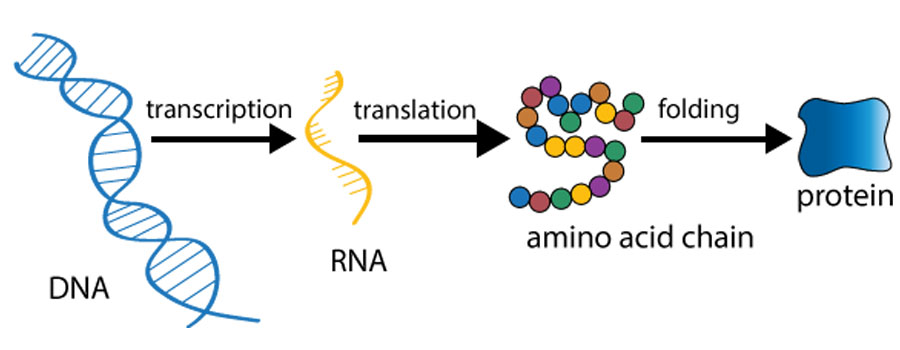

### Vistazo general del proceso de obtencion de proteinas

In [ ]:
#@title Realizando la transcripcion
print("ADN:","".join(df['LC528232.txt'].dropna())[:50])
print("mRNA:", Seq("".join(df['LC528232.txt'].dropna())).transcribe()[:50])

ADN: TGCTTATGAAAATTTTAATCTCCCAGGTAACAAACCAACCAACTTTCGAT
mRNA: UGCUUAUGAAAAUUUUAAUCUCCCAGGUAACAAACCAACCAACUUUCGAU


In [ ]:
#@title Realizando la traduccion
print("mRNA:", Seq("".join(df['LC528232.txt'].dropna())).transcribe()[:50])
print("Cadena de aminoacidos:", Seq("".join(df['LC528232.txt'].dropna())).transcribe().translate()[:41])
print("Numero de aminoacidos encontrados:", len(Seq("".join(df['LC528232.txt'].dropna())).transcribe().translate()))

mRNA: UGCUUAUGAAAAUUUUAAUCUCCCAGGUAACAAACCAACCAACUUUCGAU
Cadena de aminoacidos: CL*KF*SPR*QTNQLSISCRSVL*TNFKICVAVTRLHA*CT
Numero de aminoacidos encontrados: 9967


/usr/local/lib/python3.10/dist-packages/Bio/Seq.py:2879: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [ ]:
#@title Obteniendo los amonoacidos
Seq("".join(df['LC528232.txt'].dropna())).transcribe().translate().split('*')[:10]

[Seq('CL'),
 Seq('KF'),
 Seq('SPR'),
 Seq('QTNQLSISCRSVL'),
 Seq('TNFKICVAVTRLHA'),
 Seq('CTHAV'),
 Seq('LITNYCR'),
 Seq('QDTSNSSIFCRLLTVSSVLQPIISTSRFRPGVTER'),
 Seq('DGEPCPWFQRENTRPTQFACFTGSRRARTWLWRLRGGGLIRGTSTS'),
 Seq('RWHLWLSRS')]

In [ ]:
#@title Ahora buscamos las proteinas, las secuencias de menos de 20 amonoacidos  no lo son.
print("Proteinas encontradas: ", len([i for i in Seq("".join(df['LC528232.txt'].dropna())).transcribe().translate().split('*') if len(i) > 50]))

Proteinas encontradas:  5


###Obteniendo las proteinas de cada genoma

In [ ]:
#@title DataFrame de las proteinas por genoma

obten_proteinas = lambda col: ["".join(i) for i in Seq("".join(df[col].dropna())).transcribe().translate().split('*') if len(i) > 50]
maximo = max([len(obten_proteinas(col)) for col in df.columns])

df_proteinas = pd.DataFrame({col: obten_proteinas(col)+[None]*(maximo-len(obten_proteinas(col))) for col in df.columns if len(obten_proteinas(col)) > 0})

df_proteinas.head()

/usr/local/lib/python3.10/dist-packages/Bio/Seq.py:2879: BiopythonWarning:

Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.



,LC528232.txt,LC528233.txt,LC529905.txt,LC534418.txt,LC534419.txt,LR757995.txt,LR757996.txt,LR757998.txt,MN908947.txt,MN938384.txt,...,MZ373341.txt,MZ373342.txt,MZ373343.txt,MZ373344.txt,MZ373345.txt,MZ373346.txt,MZ373347.txt,MZ373348.txt,MZ373349.txt,MZ373350.txt
0,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,VSSGCDRKVRWRALSLVSTRKHTSNSVCLFYRFATCSYVALETPWR...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,VSSGCDRKVRWRALSLVSTRKHTSNSVCLFYRFATCSYVALETPWR...,...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,VLSGCDRKVRWRALSLVSTRKHTSNSVCLFYRFATCSYVALETPWR...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...,PKGKMESLVPGFNEKTHVQLSLPVLQVRDVLVRGFGDSVEEVLSEA...
1,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ATSLALILMKIFKKTGTLNIAVVLPVNSCVSLTEGHTLAMSITTSV...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ATSLALILMKIFKKTGTLNIAVVLPVNSCVSLTEGHTLAMSITTSV...,...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ATSLALILMKIFKKTGTLNIAVVLPVNSCVSLTEGHTLAMSITTSV...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,VKWSCVAVHYMLNQVEPHQEMPQLLMLIVFLTFVKLSRPMLMHFYL...,RCSAYTVELGTEVNEFACVVADAVIKTLQPVSELLTPLGIDLDEWS...
2,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,HVLVKLHALCPNNWTLLTLRGVYTAAVNMSMKLLGTRNVLKRAMNC...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,HVLVKLHALCPNNWTLLTLRGVYTAAVNMSMKLLGTRNVLKRAMNC...,...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,HVLVKLHALCPNNWTLLTLRGVYTAAVNMSMKLLGTRNVLKRAMNC...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,AIIVNHINHPLVFHCVLMDKFLVYIKIHVLVAIMLLTLMQLQHVTG...,CVTNVIEQQESNVQLLLMVLEGPFMSMLMEVKAFANYTIGIVLIVI...
3,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,LTPVLKDSSFLQQKRSKLLRRHLNCLMVLLLYVKCCLTENYIFHGK...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,LTPVLKDSSFLQQKRSKLLRRHLNCLMVLLLYVKCCLTENYIFHGK...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,VVTIQVLLEKVPKVLMTTFLKYSKKRKSTSILLVTLNLMKRSPLFW...,LTPVLKDSSFLQQKRSKLLRRHLNCLMVLLLYVKCCLTENYIFHGK...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,VVTIQVLLEKVPKVLMTTFLKYSKKRKSTSILLVTLNLMKRSPLFW...,...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,VVTIQVLLEKV

In [ ]:
#@title Obteniendo las proteinas unicas
df_proteinas_unicas = pd.DataFrame(columns=["Proteinas"])

cont = 0
for i in [df_proteinas[col].dropna().unique().tolist() for col in df_proteinas.columns]:
  for j in i:
    cont += 1
    if j not in df_proteinas_unicas["Proteinas"].values:
      df_proteinas_unicas.loc[len(df_proteinas_unicas)] = j

print("Proteinas recuperadas:",cont,"\nProteinas unicas:", len(df_proteinas_unicas))
df_proteinas_unicas.to_csv("df_proteinas_unicas.csv", index=False)
df_proteinas_unicas.head()

Proteinas recuperadas: 546 
Proteinas unicas: 120


,Proteinas
0,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...
1,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...
2,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...
3,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...
4,TNMKIILFLALITLATCELYHYQECVRGTTVLLKEPCSSGTYEGNS...


Con ello podemos obtener informacion de que proteina estamos visualizando con la herramienta PSI-BLAST. En ella iremos colocando las cadenas que encontramos. Por otro lado, tambien buscare de donde fue obtenido el genoma que analizo para poder extraer mas informacion. <br>
Para los puntos antes mencionados utilizare un sistema de webscraping.

In [ ]:
#@title Viendo el resultado del web scraping para proteinas
proteinas_desc = pd.read_csv('proteinas_desc.csv')
proteinas_desc.head()

,Proteinas,Name,Porcentaje
0,CTIVFKRVCGVSAARLTPCGTGTSTDVVYRAFDIYNDKVAGFAKFL...,Replicase polyprotein 1ab OS=Severe acute resp...,100.0
1,ASAQRSQITLHINELMDLFMRIFTIGTVTLKQGEIKDATPSDFVRA...,ORF3a protein OS=Severe acute respiratory synd...,100.0
2,AQADEYELMYSFVSEETGTLIVNSVLLFLAFVVFLLVTLAILTALR...,Envelope small membrane protein OS=Severe acut...,100.0
3,QQMFHLVDFQVTIAEILLIIMRTFKVSIWNLDYIINLIIKNLSKSL...,ORF6 protein OS=Severe acute respiratory syndr...,100.0
4,TNMKIILFLALITLATCELYHYQECVRGTTVLLKEPCSSGTYEGNS...,ORF7a protein OS=Severe acute respiratory synd...,100.0


In [ ]:
#@title Grafica de proteinas identificadas
fig = px.bar(x=['Indefinidos', 'Definidos'],
       y=[proteinas_desc.Name.isna().sum(), proteinas_desc.Name.notna().sum()],
       color=['Indefinidos', 'Definidos'])

fig.update_traces(
    hovertemplate='<b>Conteo:</b> %{y}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Proteinas identificadas',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark",
    xaxis_title='',
    yaxis_title='',
    showlegend=False
)

fig.show()

In [ ]:
#@title Ahora identificaremos las proteinas dentro de los genomas
proteinas_genomas = df_proteinas.map(
    lambda x : str(proteinas_desc[proteinas_desc.Proteinas == x]['Name'].iloc[0]).split("OX=")[0]
    if x in proteinas_desc.Proteinas.values else None)
proteinas_genomas.head()

,LC528232.txt,LC528233.txt,LC529905.txt,LC534418.txt,LC534419.txt,LR757995.txt,LR757996.txt,LR757998.txt,MN908947.txt,MN938384.txt,...,MZ373341.txt,MZ373342.txt,MZ373343.txt,MZ373344.txt,MZ373345.txt,MZ373346.txt,MZ373347.txt,MZ373348.txt,MZ373349.txt,MZ373350.txt
0,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1ab OS=Severe acute resp...,nan,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1ab OS=Severe acute resp...,nan,...,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1ab OS=Severe acute resp...,Replicase polyprotein 1ab OS=Severe acute resp...,nan,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1a OS=Severe acute respi...,Replicase polyprotein 1a OS=Severe acute respi...
1,ORF3a protein OS=Severe acute respiratory synd...,Mediator of RNA polymerase II transcription su...,ORF3a protein OS=Severe acute respiratory synd...,Mediator of RNA polymerase II transcription su...,ORF3a protein OS=Severe acute respiratory synd...,ORF3a protein OS=Severe acute respiratory synd...,nan,Mediator of RNA polymerase II transcription su...,ORF3a protein OS=Severe acute respiratory synd...,nan,...,ORF3a protein OS=Severe acute respiratory synd...,ORF3a protein OS=Severe acute respiratory synd...,ORF3a protein OS=Severe acute respiratory synd...,ORF3a protein OS=Severe acute respiratory synd...,nan,Mediator of RNA polymerase II transcription su...,Mediator of RNA polymerase II transcription su...,Mediator of RNA polymerase II transcription su...,Mediator of RNA polymerase II transcription su...,Replicase polyprotein 1a OS=Severe acute respi...
2,Envelope small membrane protein OS=Severe acut...,Small ribosomal subunit biogenesis GTPase RsgA...,Envelope small membrane protein OS=Severe acut...,Small ribosomal subunit biogenesis GTPase RsgA...,Envelope small membrane protein OS=Severe acut...,Envelope small membrane protein OS=Severe acut...,nan,Small ribosomal subunit biogenesis GTPase RsgA...,Envelope small membrane protein OS=Severe acut...,nan,...,Envelope small membrane protein OS=Severe acut...,Envelope small membrane protein OS=Severe acut...,Envelope small membrane protein OS=Severe acut...,Envelope small membrane protein OS=Severe acut...,nan,Small ribosomal subunit biogenesis GTPase RsgA...,Small ribosomal subunit biogenesis GTPase RsgA...,Small ribosomal subunit biogenesis GTPase RsgA...,Small ribosomal subunit biogenesis GTPase RsgA...,nan
3,ORF6 protein OS=Severe acute respiratory syndr...,"NACHT, LRR and PYD domains-containing protein ...",ORF6 protein OS=Severe acute respiratory syndr...,"NACHT, LRR and PYD domains-containing protein ...",ORF6 protein OS=Severe acute respiratory syndr...,ORF6 protein OS=Severe acute respiratory syndr...,nan,"NACHT, LRR and PYD domains-containing protein ...",ORF6 protein OS=Severe acute respiratory syndr...,nan,...,ORF6 protein OS=Severe acute respiratory syndr...,ORF6 protein OS=Severe acute respiratory syndr...,ORF6 protein OS=Severe acute respiratory syndr...,ORF6 protein OS=Severe acute respiratory syndr...,nan,"NACHT, LRR and PYD domains-containing protein ...","NACHT, LRR and PYD domains-containing protein ...","NACHT, LRR and PYD domains-containing protein ...","NACHT, LRR and PYD domains-containing protein ...",Replicase polyprotein 1a OS=Severe acute respi...
4,ORF7a protein OS=Severe acute respiratory synd...,nan,ORF7a protein OS=Severe acute respiratory synd...,nan,ORF7a protein OS=Severe acute respiratory synd...,ORF7a protein OS=Severe acute respiratory synd...,nan,nan,ORF7a protein OS=Severe acute respiratory synd...,nan,...,ORF7a protein OS=Se

In [ ]:
#@title Conteo de las proteinas encontradas por genoma

resultados = proteinas_genomas.apply(lambda x: x.replace('nan', None).dropna().value_counts()).stack().reset_index()

# Renombrar las columnas para un formato más claro
resultados.columns = ['Valor', 'Columna','Count']
resultados = resultados.groupby(['Valor']).agg({'Count':'sum'}).sort_values(by='Count', ascending=False).reset_index().head(10)
resultados.head()

,Valor,Count
0,Replicase polyprotein 1ab OS=Severe acute resp...,19.0
1,Replicase polyprotein 1a OS=Severe acute respi...,19.0
2,ORF3a protein OS=Severe acute respiratory synd...,18.0
3,Envelope small membrane protein OS=Severe acut...,17.0
4,ORF6 protein OS=Severe acute respiratory syndr...,16.0


In [ ]:
#@title Grafica de las 10 proteinas mas encontradas
fig = px.bar(data_frame=resultados, x='Valor',
       y='Count',
       color='Valor')

fig.update_traces(
    hovertemplate='<b>Conteo:</b> %{y}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Proteinas identificadas',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark",
    xaxis_title='',
    yaxis_title='',
    showlegend=False
)

fig.show()

###Obteniendo mas informacion de cada genoma
De forma similar a la obtencion de las proteinas, se utilizo web scraping para obtener la fecha y localizacion de cada genoma analizado.

In [ ]:
#@title Viendo el resultado del web scraping para genomas
genomas_desc = pd.read_csv('genomas_desc.csv')
genomas_desc.head()

,Genoma,Pais,Fecha
0,LC528232,Japan,2020-02-10
1,LC528233,Japan,2020-02-10
2,LC529905,Japan,2020-01
3,LC534418,Japan,2020-02-14
4,LC534419,Japan,2020-03-09


Parece ser que algunos paises vienen con la provincia, por lo que solo se tomara el pais de procedencia. Ademas algunas fechas solo tienen año y mes, por lo tanto, se acortaran las fechas.

In [ ]:
#@title Datos que necesitan ser tratados
print("Antes de formatear")
print(genomas_desc.Pais.unique().tolist())
print(genomas_desc.Fecha.unique().tolist())
print("Despues de formatear")
genomas_desc.Pais = genomas_desc.Pais.apply(lambda pais: pais.split(':')[0] if ':' in pais else pais)
genomas_desc.Fecha = genomas_desc.Fecha.apply(lambda fecha: fecha[:7])
print(genomas_desc.Pais.unique().tolist())
print(genomas_desc.Fecha.unique().tolist())

Antes de formatear
['Japan', 'China:Wuhan', 'China', 'China: Shenzhen', 'USA', 'USA: Illinois', 'USA: CA', 'China: Wuhan', 'USA: AZ', 'Iran', 'India']
['2020-02-10', '2020-01', '2020-02-14', '2020-03-09', '2019-12-26', '2020-01-01', '2019-12', '2020-01-10', '2020-01-11', '2020-01-19', '2020-01-02', '2020-01-21', '2020-01-23', '2020-01-22', '2019-12-30', '2020-04-28', '2021-04-10', '2021-04-06', '2021-04-07', '2021-03-15', '2021-04-05', '2021-03-26', '2021-03-18', '2020-08-20', '2020-08-16', '2021-01-16', '2020-06-16', '2020-08-15', '2021-03-12']
Despues de formatear
['Japan', 'China', 'USA', 'Iran', 'India']
['2020-02', '2020-01', '2020-03', '2019-12', '2020-04', '2021-04', '2021-03', '2020-08', '2021-01', '2020-06']


In [ ]:
#@title Grafica territorial de los genomas por pais
muestras = genomas_desc.Pais.value_counts().to_frame().reset_index()
muestras = pd.concat([muestras, pd.DataFrame(columns=['lat', 'lng'])])
for index, pais in enumerate(muestras.Pais.unique()):
  geolocator = Nominatim(user_agent="Linux")
  location = geolocator.geocode(pais)
  muestras.loc[index, 'lat'] = location.latitude
  muestras.loc[index, 'lng'] = location.longitude

fig = px.scatter_map(muestras, lat="lat", lon="lng", color="count", hover_name='Pais',
                size="count", title='Genomas por pais',
                zoom=1,
                labels={
                    'count': 'Genomas'
                })

fig.update_traces(
    hovertemplate='<b>Pais:</b> %{hovertext}<br>' +
                  '<b>Genomas:</b> %{marker.size}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Genomas por pais',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark",
    map_style="white-bg",
    map_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        },
        {
            "sourcetype": "raster",
            "sourceattribution": "Government of Canada",
            "source": ["https://geo.weather.gc.ca/geomet/?"
                       "SERVICE=WMS&VERSION=1.3.0&REQUEST=GetMap&BBOX={bbox-epsg-3857}&CRS=EPSG:3857"
                       "&WIDTH=1000&HEIGHT=1000&LAYERS=RADAR_1KM_RDBR&TILED=true&FORMAT=image/png"],
        }
      ]
    )

fig.show()
# fig.write_html("mapa_ventas.html")

In [ ]:
#@title Grafica de pertenencia en paises
fig = px.bar(data_frame=genomas_desc.Pais.value_counts().to_frame().reset_index(),
             x='Pais', y='count', color='Pais')

fig.update_traces(
    hovertemplate='<b>Conteo:</b> %{y}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Genomas por pais',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark",
    xaxis_title='',
    yaxis_title='',
    showlegend=False
)

fig.show()

In [ ]:
#@title Grafica de fechas de los genomas
fig = px.area(data_frame=genomas_desc.Fecha.value_counts().to_frame().sort_values(by='Fecha').reset_index(),
             x='Fecha', y='count', pattern_shape_sequence='x', )

fig.update_traces(
    line_color='cyan',  # Color de la línea
    fillcolor='rgba(0,255,255,0.5)',  # Color de relleno con transparencia
    hovertemplate='<b>Fecha:</b> %{x|%b %Y}<br>' +
                  '<b>Conteo:</b> %{y}<br>' +
                  '<extra></extra>'
)

fig.update_layout(
    title={
      'text': 'Fechas de los genomas',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark",
    xaxis_title='',
    yaxis_title='',
    showlegend=False
)

fig.show()

### Relacion genomas paises y fechas


In [ ]:
#@title Obteniendo las coordenadas y uniendolas en cada genoma
muestra2 = genomas_desc.copy()

# Realizar un merge para agregar las coordenadas basado en el país
muestra2 = muestra2.merge(muestras[['Pais', 'lat', 'lng']], on='Pais', how='left')

# Agrupar por País y Fecha, y calcular las coordenadas y el conteo de filas en cada grupo
muestra2 = (
    muestra2.groupby(['Pais', 'Fecha'], as_index=False)
    .agg(
        lat=('lat', 'first'),
        lng=('lng', 'first'),
        count=('Pais', 'size')  # Aquí contamos las filas por grupo
    )
)

muestra2['Fecha'] = pd.to_datetime(muestra2['Fecha'])

# Crear columnas temporales para año y mes
muestra2['Año'] = muestra2['Fecha'].dt.year
muestra2['Mes'] = muestra2['Fecha'].dt.month

# Ordenar por año y mes
muestra2 = muestra2.sort_values(by=['Año', 'Mes'], ascending=[True, True]).reset_index(drop=True)

# Eliminar las columnas temporales si no las necesitas
muestra2 = muestra2.drop(columns=['Año', 'Mes'])
muestra2['Fecha'] = muestra2['Fecha'].dt.strftime('%m-%Y')

# Mostrar las primeras filas del resultado
muestra2.head()

,Pais,Fecha,lat,lng,count
0,China,12-2019,35.000066,104.999955,7
1,China,01-2020,35.000066,104.999955,5
2,Japan,01-2020,36.574844,139.239418,1
3,USA,01-2020,39.78373,-100.445882,5
4,Japan,02-2020,36.574844,139.239418,3


In [ ]:
#@title Grafica territorial de los genomas por pais
fig = px.density_mapbox(muestra2, lat="lat", lon="lng", hover_name='Pais',
                z="count", title='Genomas por pais',
                zoom=1, radius=20,
                labels={
                    'count': 'Genomas'
                },
                animation_frame="Fecha", mapbox_style="open-street-map")

fig.update_traces(
    hovertemplate='<b>Pais:</b> %{hovertext}<br>' +
                  '<b>Genomas:</b> %{z}<br>' +
                  '<extra></extra>'
)

for frame in fig.frames:
    for trace in frame.data:
        trace.hovertemplate = '<b>País:</b> %{hovertext}<br>' + \
                              '<b>Genomas:</b> %{z}<br>' + \
                              '<extra></extra>'

fig.update_layout(
    title={
      'text': 'Genomas por pais',
      'x': 0.5,  # Centra el título horizontalmente
      'xanchor': 'center',  # Ancla el título al centro
      'yanchor': 'top',  # Ancla el título en la parte superior
      'font': dict(color='white')  # Color blanco para el título
    },
    font_size=16,
    template="plotly_dark"
)

fig.show()
# fig.write_html("mapa_ventas.html")